# Predict cell types with the scAdam model hub

[**scAdam**](https://scparadise.readthedocs.io/en/latest/theory.html#scadam-models)  is specifically developed for annotating cell types, especially focusing on rare cell types that may be underrepresented in the dataset.

**Advantages**
1. scAdam not only detects all cell types in any test dataset but also generates reproducible results, which is an important aspect for reliable biological interpretation.
2. It enables multi-level annotation by allowing the researchers to extract individual cell types for targeted investigations.
3. Unknown cell type identification makes it possible to identify new cell types that are absent from the data on which the scAdam model was trained.

**Integration with Other Tools:** <br>
scAdam is part of a bigger toolkit that includes other tools, such as [**scEve**](https://scparadise.readthedocs.io/en/latest/theory.html#sceve-models) for surface protein prediction and [**scNoah**](https://scparadise.readthedocs.io/en/latest/theory.html#scnoah-metrics) for benchmarking, making it a comprehensive solution for single-cell analysis.

In [1]:
# Python packages
import warnings
warnings.simplefilter('ignore')

import anndata
import scanpy as sc
import scparadise
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

sc.set_figure_params(dpi = 120)

## Dataset recommendations

Our models are trained on shifted logarithm-normalized data.

To ensure proper use of the models, apply the following preprocessing steps:

```python
sc.pp.normalize_total(adata, target_sum=None)
sc.pp.log1p(adata)
```

## PBMC

In [2]:
# Load dataset from 10x Genomics
url = "https://cf.10xgenomics.com/samples/cell-exp/6.1.0/10k_PBMC_3p_nextgem_Chromium_X/10k_PBMC_3p_nextgem_Chromium_X_filtered_feature_bc_matrix.h5"
adata = sc.read_10x_h5("dataset.h5", backup_url = url)
adata.var_names_make_unique()
adata

100%|█████████████████████████████████████| 37.7M/37.7M [00:02<00:00, 15.2MB/s]


AnnData object with n_obs × n_vars = 11996 × 36601
    var: 'gene_ids', 'feature_types', 'genome'

### QC
Standard quality control from scanpy tutorial

In [3]:
# mitochondrial genes, "MT-" for human, "Mt-" for mouse
adata.var["mt"] = adata.var_names.str.startswith("MT-")
# ribosomal genes
adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))
# hemoglobin genes
adata.var["hb"] = adata.var_names.str.contains("^HB[^(P)]")

In [4]:
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo", "hb"], inplace=True, log1p=True
)

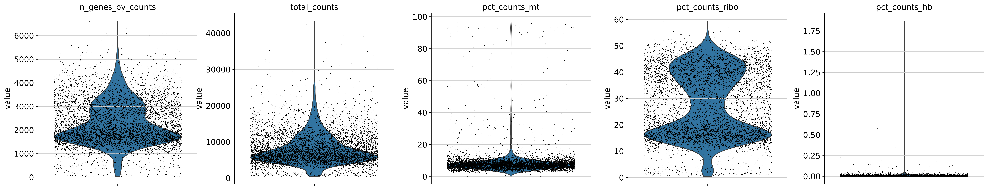

In [5]:
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt", 'pct_counts_ribo', 'pct_counts_hb'],
    jitter=0.4,
    multi_panel=True,
)

In [6]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

In [7]:
# Detect doublets
sc.pp.scrublet(adata)

In [8]:
# Remove doublets + other QC metrics
adata = adata[adata.obs['predicted_doublet'] == False]
sc.pp.filter_cells(adata, max_genes = 5000)
sc.pp.filter_cells(adata, max_counts = 20000)
adata = adata[adata.obs['pct_counts_mt'] < 15]

### Normalization, HVG, neighbors, PCA, UMAP
We recommend using shifted logarithm data normalization as described here.

In [9]:
# Saving count data
adata.layers["counts"] = adata.X.copy()
# Normalization (shifted logarithm)
sc.pp.normalize_total(adata, target_sum=None)
sc.pp.log1p(adata) 
# scParadise use normalized data in adata.raw!!!
adata.raw = adata
# HVG
sc.pp.highly_variable_genes(adata, n_top_genes=2000)
# PCA
sc.tl.pca(adata)
# Nearest neighbors analysis
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=30)
# UMAP
sc.tl.umap(adata, min_dist=0.75)

### scParadise prediction (scAdam)
You can view all available scAdam models by calling `scparadise.scadam.available_models` without arguments, or by visiting the [**Models page**](https://scparadise.readthedocs.io/en/latest/model_hub/scAdam_models.html) in the scParadise documentation.

In [11]:
# Available models for cell type annotation
scparadise.scadam.available_models(
    species = 'human', 
    tissue = 'blood'
)

,Model name,Tissue/Organ,Species,Description,Suspension,Accuracy,Balanced Accuracy,Number of Levels
0,Human_PBMC,blood,human,Peripheral blood mononuclear cells of healthy ...,cells,0.979,0.979,3


In [10]:
# Alternatively, you can use query to search across all columns 
# in the table of available scAdam models 
# (Model name, Tissue/Organ, Species, and Description).
scparadise.scadam.available_models(
    query = 'PBMC'
)

,Model name,Tissue/Organ,Species,Description,Suspension,Accuracy,Balanced Accuracy,Number of Levels
0,Human_PBMC,blood,human,Peripheral blood mononuclear cells of healthy ...,cells,0.979,0.979,3


In [12]:
# Download model for cell type prediction
scparadise.scadam.download_model('Human_PBMC', save_path='')

In [13]:
# Predict cell types using trained model
adata = scparadise.scadam.predict(
    adata, 
    path_model = 'Human_PBMC_scAdam'
)

Cell type annotation using the 2nd version of the scAdam model
scAdam model with unknown detector loaded from Human_PBMC_scAdam
Gene alignment:
  Model features: 947
  Matched features: 935 (98.7%)


Predicting: 100%|██████████████████████████████| 43/43 [00:00<00:00, 78.50it/s]


Added cell type column: pred_celltype_l1
Added probabilities column: pred_celltype_l1_probability
Added cell type column: pred_celltype_l2
Added probabilities column: pred_celltype_l2_probability
Added cell type column: pred_celltype_l3
Added probabilities column: pred_celltype_l3_probability


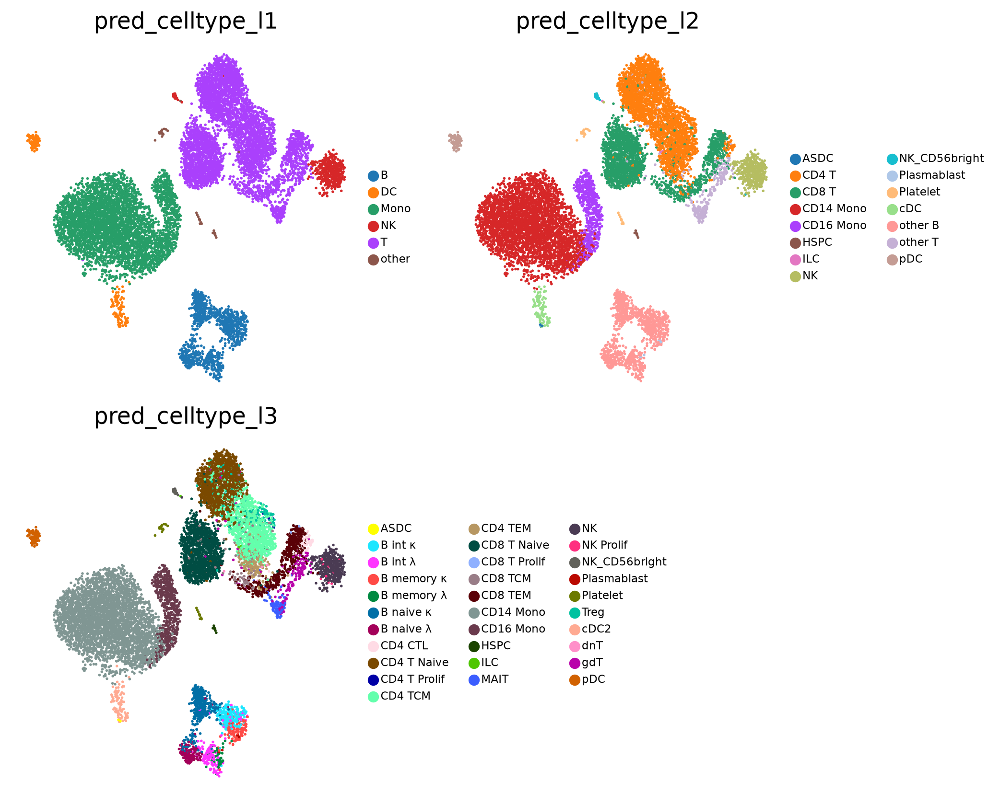

In [14]:
# Visualise predicted cell types levels
sc.pl.embedding(
    adata, 
    color = [
        'pred_celltype_l1',
        'pred_celltype_l2',
        'pred_celltype_l3',
    ],
    basis = 'X_umap',
    frameon = False,
    legend_loc = 'right margin',
    legend_fontsize = 7,
    ncols = 2,
    wspace = 0.1, 
    hspace = 0.1
)

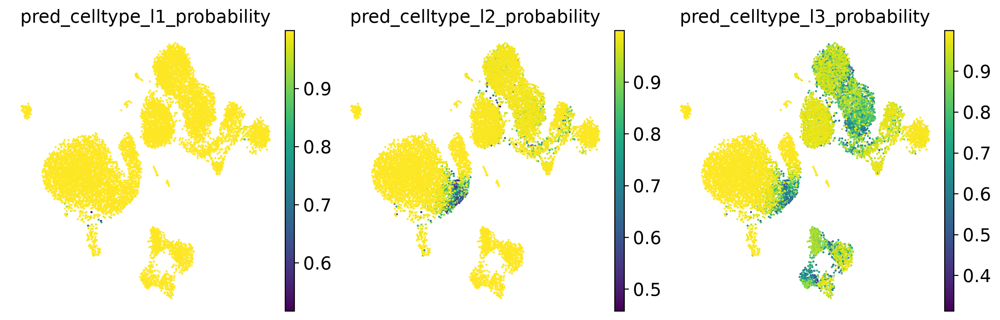

In [15]:
# Visualise prediction probabilities
sc.pl.embedding(
    adata, 
    color = [
        'pred_celltype_l1_probability',
        'pred_celltype_l2_probability',
        'pred_celltype_l3_probability',
    ],
    basis = 'X_umap',
    frameon = False,
    legend_loc = 'right margin',
    legend_fontsize = 7,
    ncols = 3,
    wspace = 0.1, 
    hspace = 0.1
)

### Check prediction results

In [16]:
# Visualization of marker genes of some predicted cell types
marker_genes = {
    "CD4 T" : ['CD4', 'CD3E'],
    "CD8 T" : ['CD8B', 'CD8A'],
    "CD14 Mono": ['CD14', 'LYZ'],
    "CD16 Mono": ['FCGR3A', 'MS4A7'],  
    "HSPC": ['CD34', 'PRSS57'],
    "ILC": ['KIT', 'IL1R1'],
    "NK": ['KLRF1'],
    "NK_CD56bright": ['NCAM1', 'XCL1', 'XCL2'],
    "Plasmablast": ['MZB1', 'JCHAIN'],
    "Platelet": ['PPBP', 'PF4', 'GP9'],
    "cDC": ['CD1C', 'FCER1A'],
    "other B": ['CD79B', 'CD79A'],
    "other T": ['SLC4A10', "TRDC", 'TRGC2'],
    "pDC": ['SCT', 'CLEC4C'],
}

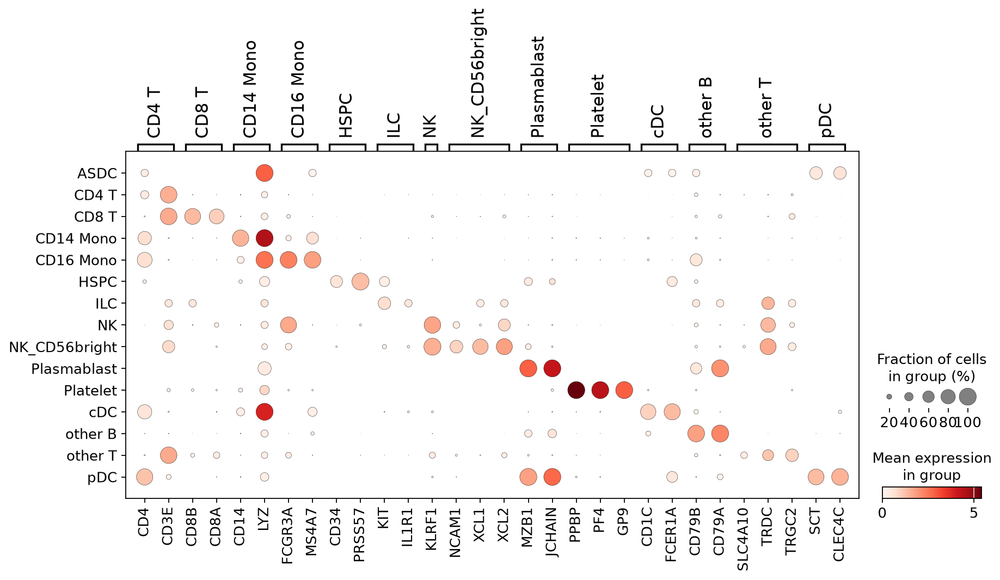

In [17]:
# Dot plot
sc.set_figure_params(dpi = 80)
sc.pl.dotplot(adata, marker_genes, "pred_celltype_l2", dendrogram=False)

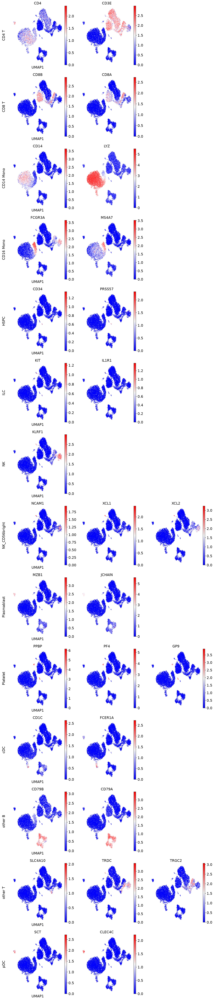

In [18]:
# Make Axes
# Number of needed rows and columns (based on the row with the most columns)
nrow = len(marker_genes)
ncol = max([len(vs) for vs in marker_genes.values()])
fig, axs = plt.subplots(nrow, ncol, figsize=(4 * ncol, 4 * nrow))
# Plot expression for every marker on the corresponding Axes object
for row_idx, (cell_type, markers) in enumerate(marker_genes.items()):
    col_idx = 0
    for marker in markers:
        ax = axs[row_idx, col_idx]
        sc.pl.umap(
            adata, 
            color=marker, 
            ax=ax, 
            show=False, 
            cmap='bwr', 
            frameon=False, 
        )
        # Add cell type as row label - here we simply add it as ylabel of
        # the first Axes object in the row
        if col_idx == 0:
            # We disabled axis drawing in UMAP to have plots without background and border
            # so we need to re-enable axis to plot the ylabel
            ax.axis("on")
            ax.tick_params(
                top="off",
                bottom="off",
                left="off",
                right="off",
                labelleft="on",
                labelbottom="off",
            )
            ax.set_ylabel(cell_type + "\n", rotation=90, fontsize=14)
            ax.set(frame_on=False)
        col_idx += 1
    # Remove unused column Axes in the current row
    while col_idx < ncol:
        axs[row_idx, col_idx].remove()
        col_idx += 1
# Alignment within the Figure
fig.tight_layout()

In [19]:
# Save anndata with predicted annotations
adata.write_h5ad('PBMC_annotated.h5ad')

## Pancreas

Below is an example of cross-technology scAdam cell type annotation. Here, we use an scAdam model trained on a dataset generated with 10x Genomics technology to annotate cell types in five other scRNA-seq technologies: CEL-Seq, Fluidigm C1, Smart-seq2, Smarter, and inDrop.

Download the pancreas benchmarking dataset from the scIB benchmarks. <br>
The prepared integrated dataset is available on Figshare: https://figshare.com/ndownloader/files/65860794

In [21]:
# Extract data
import gzip, shutil
with gzip.open("pancreas.h5ad.gz", "rb") as f_in:
    with open("pancreas.h5ad", "wb") as f_out:
        shutil.copyfileobj(f_in, f_out)

In [25]:
adata = sc.read("pancreas.h5ad")
adata

AnnData object with n_obs × n_vars = 16375 × 19093
    obs: 'tech', 'celltype', 'corrected_celltype'
    obsm: 'X_umap'

### Normalization, HVG, neighbors, PCA, UMAP
Our models were trained on data normalized using the shifted logarithm algorithm. <br>
Therefore, we recommend applying the same normalization method to your data before using the models.

In [26]:
# Saving count data
adata.layers["counts"] = adata.X.copy()
# Normalization (shifted logarithm)
sc.pp.normalize_total(adata, target_sum=None)
sc.pp.log1p(adata) 
# scParadise use normalized data in adata.raw!!!
adata.raw = adata

### scParadise prediction (scAdam)
You can view all available scAdam models by calling `scparadise.scadam.available_models` without arguments, or by visiting the [**Models page**](https://scparadise.readthedocs.io/en/latest/model_hub/scAdam_models.html) in the scParadise documentation.

In [27]:
# Available models can be filtered by metadata fields such as species and tissue/organ. 
scparadise.scadam.available_models(
    species = 'human', 
    tissue = 'pancreas'
)

,Model name,Tissue/Organ,Species,Description,Suspension,Accuracy,Balanced Accuracy,Number of Levels
0,Human_Pancreas,pancreas,human,Pancreatic islet atlas,cells,0.996,0.989,1


In [28]:
# Alternatively, the query parameter can be used to search across all columns of the available-models table.
scparadise.scadam.available_models(
    query = 'pancreas'
)

,Model name,Tissue/Organ,Species,Description,Suspension,Accuracy,Balanced Accuracy,Number of Levels
0,Human_Pancreas,pancreas,human,Pancreatic islet atlas,cells,0.996,0.989,1


In [30]:
scparadise.scadam.download_model('Human_Pancreas')

In [31]:
# Predict cell types using trained model
adata = scparadise.scadam.predict(
    adata, 
    path_model = 'Human_Pancreas_scAdam'
)

Cell type annotation using the 2nd version of the scAdam model
scAdam model with unknown detector loaded from Human_Pancreas_scAdam
Gene alignment:
  Model features: 624
  Matched features: 589 (94.4%)


Predicting: 100%|█████████████████████████████| 64/64 [00:00<00:00, 153.44it/s]

Added cell type column: pred_celltype_l1
Added probabilities column: pred_celltype_l1_probability


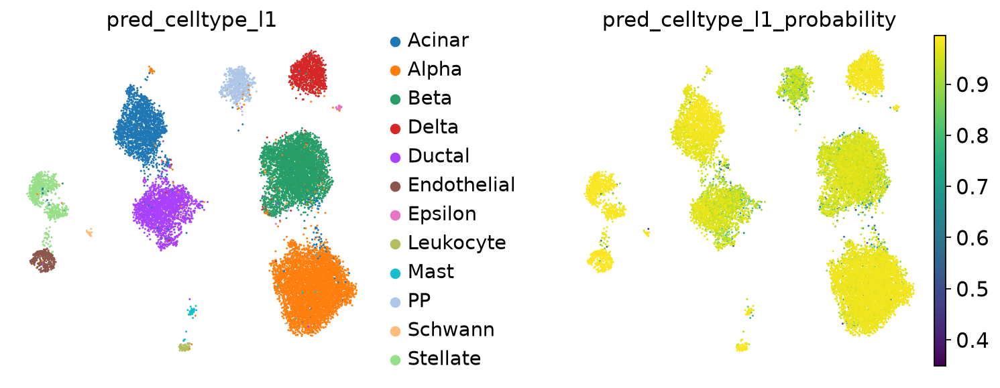

In [32]:
# Visualise predicted cell types levels
sc.pl.embedding(
    adata,
    color = [
        'pred_celltype_l1',
        'pred_celltype_l1_probability'
    ],
    basis = 'X_umap',
    frameon = False,
    wspace = 0.4,
    legend_loc = 'right margin'
)

In [33]:
# Visualization of marker genes of some predicted cell types
marker_genes = {
    "Alpha" : ['GCG', 'DPP4', 'TTR'],
    "Beta" : ['INS', 'IAPP', 'MAFA'],
    "Acinar": ['PRSS1', 'CPA1', 'CPA2'],
    "Delta": ['SST', 'LY6H'],
    "Ductal": ['KRT19', 'SPP1', 'CFTR'],
    "Endothelial": ['PECAM1', 'KDR', 'CDH5', 'CLDN5'],
    "Epsilon": ['GHRL'],
    "Leukocyte": ['PTPRC', 'CD14', 'CD68'],
    "Mast": ['TPSAB1', 'CPA3'],
    "PP": ['PPY'],
    "Schwann": ['NGFR', 'S100B'],
    "Stellate": ['COL1A1', 'COL1A2', 'THY1']
}

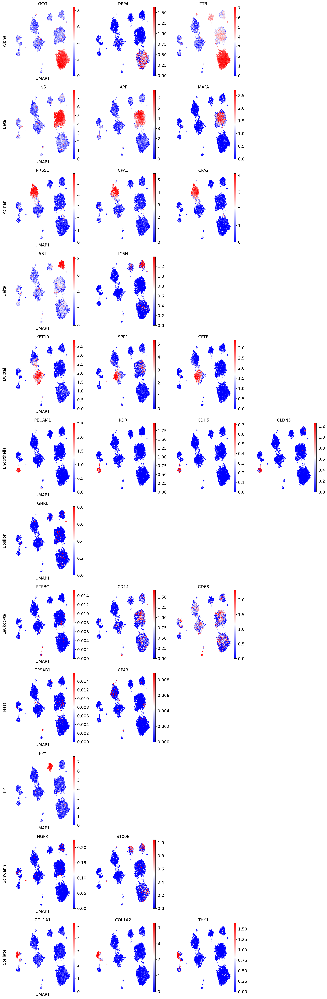

In [34]:
# Make Axes
# Number of needed rows and columns (based on the row with the most columns)
nrow = len(marker_genes)
ncol = max([len(vs) for vs in marker_genes.values()])
fig, axs = plt.subplots(nrow, ncol, figsize=(4 * ncol, 4 * nrow))
# Plot expression for every marker on the corresponding Axes object
for row_idx, (cell_type, markers) in enumerate(marker_genes.items()):
    col_idx = 0
    for marker in markers:
        ax = axs[row_idx, col_idx]
        sc.pl.umap(
            adata, 
            color=marker, 
            ax=ax, 
            show=False, 
            cmap='bwr', 
            vmax='p99',
            frameon=False
        )
        # Add cell type as row label - here we simply add it as ylabel of
        # the first Axes object in the row
        if col_idx == 0:
            # We disabled axis drawing in UMAP to have plots without background and border
            # so we need to re-enable axis to plot the ylabel
            ax.axis("on")
            ax.tick_params(
                top="off",
                bottom="off",
                left="off",
                right="off",
                labelleft="on",
                labelbottom="off",
            )
            ax.set_ylabel(cell_type + "\n", rotation=90, fontsize=14)
            ax.set(frame_on=False)
        col_idx += 1
    # Remove unused column Axes in the current row
    while col_idx < ncol:
        axs[row_idx, col_idx].remove()
        col_idx += 1
# Alignment within the Figure
fig.tight_layout()

In [35]:
adata.write_h5ad('pancreas_annotated.h5ad')

In [36]:
import session_info2
session_info2.session_info()

Package,Version
pandas,2.3.3
anndata,0.12.16
scanpy,1.11.5
scparadise,1.2.0
numpy,2.4.6
matplotlib,3.11.0
Component,Info
Python,"3.11.15 (main, Jun 11 2026, 15:20:16) [GCC 14.3.0]"
OS,Linux-6.8.0-138-generic-x86_64-with-glibc2.39
Updated,2026-09-03 20:22
